In [1]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import albumentations as A
import time
from tqdm import tqdm

In [2]:
fruit_names = os.listdir('Test/')


# Form a dictionary to store fruit information
obj_dict = {}
for idx, fruit_name in enumerate(fruit_names, start=1):
    obj_dict[idx] = {
        'folder': fruit_name,
        'longest_min': 150,
        'longest_max': 800,
        'images': sorted(os.listdir(os.path.join('Data/New Dataset', fruit_name))),
        'masks': sorted(os.listdir(os.path.join('Data/Masked New Dataset', fruit_name)))
    }


def get_img_and_mask(img_path, mask_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    
    mask_b = mask[:,:,0] <= 150  # This is boolean mask
    mask = 1 - mask_b.astype(np.uint8)  # Invert the mask
    
    return img, mask


Image file: Data/New Dataset/Apple Braeburn/37_100.jpg
Mask file: Data/Masked New Dataset/Apple Braeburn/37_100.jpg

Shape of the image of the object: (100, 100, 3)
Shape of the binary mask: (100, 100)


Text(0.5, 1.0, 'Binary mask')

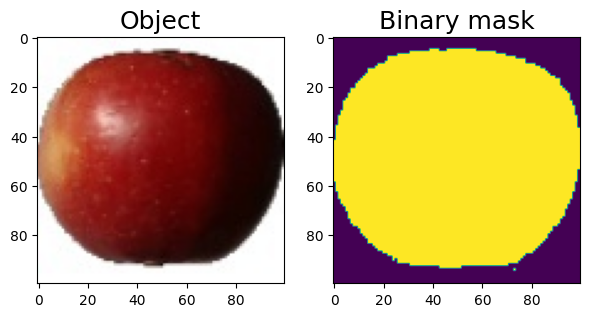

In [3]:
# Let's look at a random object and its binary mask
img_path = 'Data/New Dataset/Apple Braeburn/37_100.jpg'
mask_path = 'Data/Masked New Dataset/Apple Braeburn/37_100.jpg'
img, mask = get_img_and_mask(img_path, mask_path)

print("Image file:", img_path)
print("Mask file:", mask_path)
print("\nShape of the image of the object:", img.shape)
print("Shape of the binary mask:", mask.shape)

fig, ax = plt.subplots(1, 2, figsize=(7, 7))
ax[0].imshow(img)
ax[0].set_title('Object', fontsize=18)
ax[1].imshow(mask)
ax[1].set_title('Binary mask', fontsize=18)

In [4]:
def resize_img(img, desired_max, desired_min=None):
   
    h, w = img.shape[0], img.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = desired_max
    if desired_min:
        shortest_new = desired_min
    else:
        shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Compose([
        A.Sequential([
        A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)
        ], p=1)
    ])

    transformed = transform_resize(image=img)
    img_r = transformed["image"]
        
    return img_r

Shape of the original background image: (1024, 1024, 3)
Shape of the resized background image (desired_max=1920, desired_min=None): (1920, 1920, 3)
Shape of the resized background image (desired_max=1920, desired_min=1080): (1080, 1920, 3)


Text(0.5, 1.0, 'Resized (desired_max=1920, desired_min=1080)')

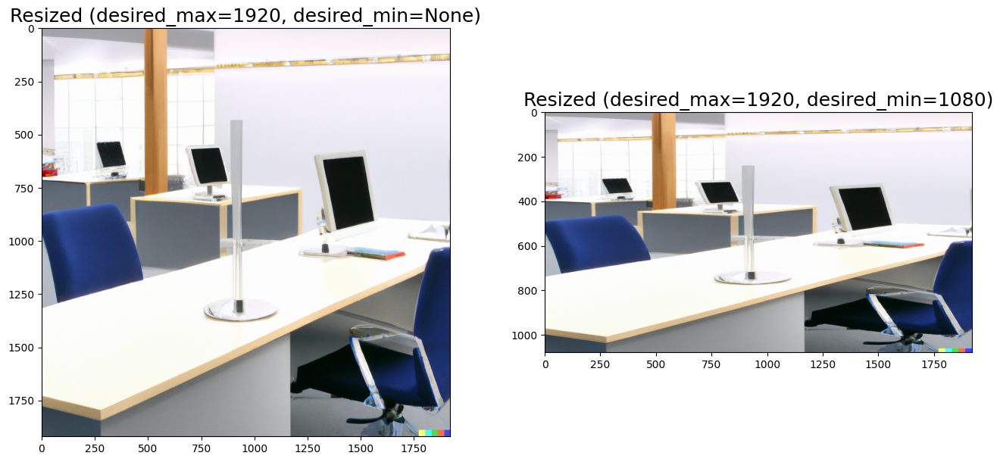

In [5]:
# Let's look how a random background image can be resized with resize_img() function

img_bg_path = 'Data/Back Ground/bg1.png'
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

img_bg_resized_1 = resize_img(img_bg, desired_max=1920, desired_min=None)
img_bg_resized_2 = resize_img(img_bg, desired_max=1920, desired_min=1080)

print("Shape of the original background image:", img_bg.shape)

print("Shape of the resized background image (desired_max=1920, desired_min=None):", img_bg_resized_1.shape)
print("Shape of the resized background image (desired_max=1920, desired_min=1080):", img_bg_resized_2.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_bg_resized_1)
ax[0].set_title('Resized (desired_max=1920, desired_min=None)', fontsize=18)
ax[1].imshow(img_bg_resized_2)
ax[1].set_title('Resized (desired_max=1920, desired_min=1080)', fontsize=18)


In [6]:
def resize_transform_obj(img, mask, longest_min, longest_max, transforms=False):
   
    h, w = mask.shape[0], mask.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = np.random.randint(longest_min, longest_max)
    shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)

    transformed_resized = transform_resize(image=img, mask=mask)
    img_t = transformed_resized["image"]
    mask_t = transformed_resized["mask"]
        
    if transforms:
        transformed = transforms(image=img_t, mask=mask_t)
        img_t = transformed["image"]
        mask_t = transformed["mask"]
        
    return img_t, mask_t

transforms_bg_obj = A.Compose([
    A.RandomRotate90(p=1),
    A.ColorJitter(brightness=0.3,
                  contrast=0.3,
                  saturation=0.3,
                  hue=0.07,
                  always_apply=False,
                  p=1),
    A.Blur(blur_limit=(3,15),
           always_apply=False,
           p=0.5)
])

transforms_obj = A.Compose([
    A.RandomRotate90(p=1),
    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.2),
                               contrast_limit=0.1,
                               brightness_by_max=True,
                               always_apply=False,
                               p=1)
])

Shape of the image of the transformed object: (349, 349, 3)
Shape of the transformed binary mask: (349, 349)




Text(0.5, 1.0, 'Transformed binary mask')

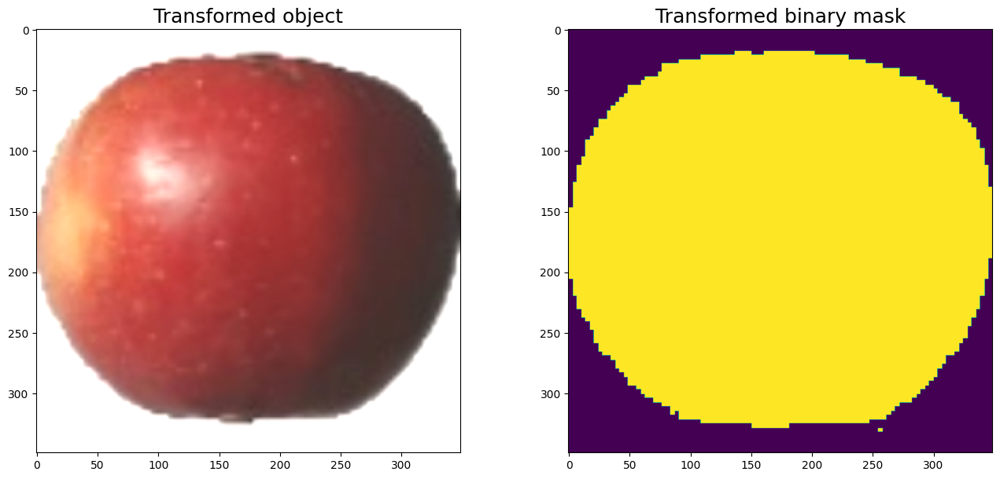

In [7]:
# Let's look how image and binary mask of a random object can be transformed
# with help of resize_transform_obj() function

img_path = 'Data/New Dataset/Apple Braeburn/37_100.jpg'
mask_path = 'Data/Masked New Dataset/Apple Braeburn/37_100.jpg'

img, mask = get_img_and_mask(img_path, mask_path)

img_t, mask_t = resize_transform_obj(img,
                                     mask,
                                     longest_min=300,
                                     longest_max=400,
                                     transforms=transforms_obj)

print("Shape of the image of the transformed object:", img_t.shape)
print("Shape of the transformed binary mask:", mask_t.shape)
print("\n")

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_t)
ax[0].set_title('Transformed object', fontsize=18)
ax[1].imshow(mask_t)
ax[1].set_title('Transformed binary mask', fontsize=18)

In [8]:
def add_obj(img_comp, mask_comp, img, mask, x, y, idx):
    '''
    img_comp - composition of objects
    mask_comp - composition of objects` masks
    img - image of object
    mask - binary mask of object
    x, y - coordinates where center of img is placed
    Function returns img_comp in CV2 RGB format + mask_comp
    '''
    h_comp, w_comp = img_comp.shape[0], img_comp.shape[1]
    
    h, w = img.shape[0], img.shape[1]
    
    x = x - int(w/2)
    y = y - int(h/2)
    
    mask_b = mask == 1
    mask_rgb_b = np.stack([mask_b, mask_b, mask_b], axis=2)
    
    if x >= 0 and y >= 0:
    
        h_part = h - max(0, y+h-h_comp) # h_part - part of the image which gets into the frame of img_comp along y-axis
        w_part = w - max(0, x+w-w_comp) # w_part - part of the image which gets into the frame of img_comp along x-axis

        img_comp[y:y+h_part, x:x+w_part, :] = img_comp[y:y+h_part, x:x+w_part, :] * ~mask_rgb_b[0:h_part, 0:w_part, :] + (img * mask_rgb_b)[0:h_part, 0:w_part, :]
        mask_comp[y:y+h_part, x:x+w_part] = mask_comp[y:y+h_part, x:x+w_part] * ~mask_b[0:h_part, 0:w_part] + (idx * mask_b)[0:h_part, 0:w_part]
        mask_added = mask[0:h_part, 0:w_part]
        
    elif x < 0 and y < 0:
        
        h_part = h + y
        w_part = w + x
        
        img_comp[0:0+h_part, 0:0+w_part, :] = img_comp[0:0+h_part, 0:0+w_part, :] * ~mask_rgb_b[h-h_part:h, w-w_part:w, :] + (img * mask_rgb_b)[h-h_part:h, w-w_part:w, :]
        mask_comp[0:0+h_part, 0:0+w_part] = mask_comp[0:0+h_part, 0:0+w_part] * ~mask_b[h-h_part:h, w-w_part:w] + (idx * mask_b)[h-h_part:h, w-w_part:w]
        mask_added = mask[h-h_part:h, w-w_part:w]
        
    elif x < 0 and y >= 0:
        
        h_part = h - max(0, y+h-h_comp)
        w_part = w + x
        
        img_comp[y:y+h_part, 0:0+w_part, :] = img_comp[y:y+h_part, 0:0+w_part, :] * ~mask_rgb_b[0:h_part, w-w_part:w, :] + (img * mask_rgb_b)[0:h_part, w-w_part:w, :]
        mask_comp[y:y+h_part, 0:0+w_part] = mask_comp[y:y+h_part, 0:0+w_part] * ~mask_b[0:h_part, w-w_part:w] + (idx * mask_b)[0:h_part, w-w_part:w]
        mask_added = mask[0:h_part, w-w_part:w]
        
    elif x >= 0 and y < 0:
        
        h_part = h + y
        w_part = w - max(0, x+w-w_comp)
        
        img_comp[0:0+h_part, x:x+w_part, :] = img_comp[0:0+h_part, x:x+w_part, :] * ~mask_rgb_b[h-h_part:h, 0:w_part, :] + (img * mask_rgb_b)[h-h_part:h, 0:w_part, :]
        mask_comp[0:0+h_part, x:x+w_part] = mask_comp[0:0+h_part, x:x+w_part] * ~mask_b[h-h_part:h, 0:w_part] + (idx * mask_b)[h-h_part:h, 0:w_part]
        mask_added = mask[h-h_part:h, 0:w_part]
    
    return img_comp, mask_comp, mask_added

In [9]:
import random
def choose_bg():
    bg_folder_path = 'Data/Back Ground'

    # Get a list of background image files
    bg_files = [f for f in os.listdir(bg_folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not bg_files:
        raise ValueError("No valid background images found in the folder.")

    # Choose a random background image
    random_bg_file = random.choice(bg_files)

    # Construct the path to the selected background image
    img_bg_path = os.path.join(bg_folder_path, random_bg_file)

    return img_bg_path   

In [10]:
def choose_img(data_path,mask_path):
    selected_obj = random.choice(list(obj_dict.keys()))
    selected_folder = obj_dict[selected_obj]['folder']
    selected_image = random.choice(obj_dict[selected_obj]['images'])

    img_path = os.path.join(data_path, selected_folder, selected_image)
    mask_path = os.path.join(mask_path, selected_folder, selected_image)
    return img_path, mask_path

Text(0.5, 1.0, 'Composition mask')

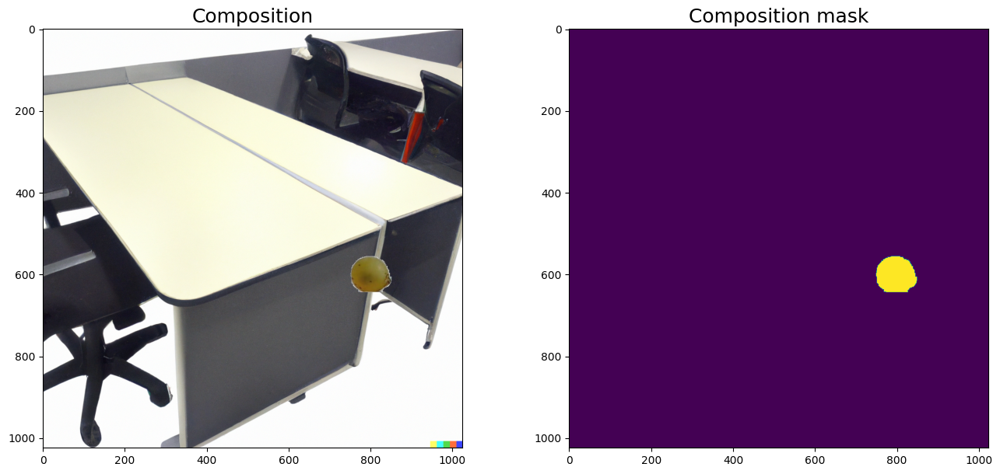

In [18]:
img_bg_path = choose_bg()
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

h, w = img_bg.shape[0], img_bg.shape[1]
mask_comp = np.zeros((h,w), dtype=np.uint8)

data_path = 'Data/New Dataset/'
mask_path = 'Data/Masked New Dataset/'
img_path , mask_path =choose_img(data_path,mask_path)

img, mask = get_img_and_mask(img_path, mask_path)

img_comp, mask_comp, _ = add_obj(img_bg, mask_comp, img, mask, x=800, y=600, idx=1)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18)

Text(0.5, 1.0, 'Composition mask')

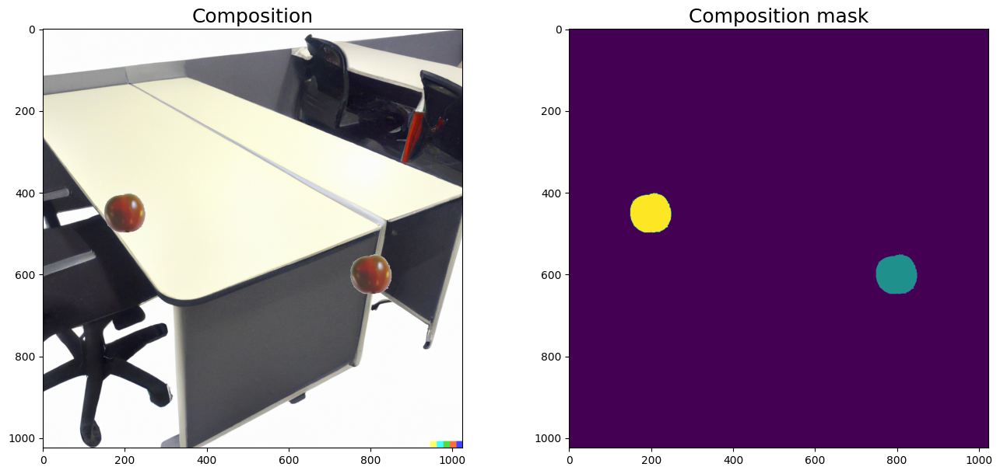

In [12]:
img_comp, mask_comp, _ = add_obj(img_comp, mask_comp, img, mask, x=200, y=450, idx=2)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18)

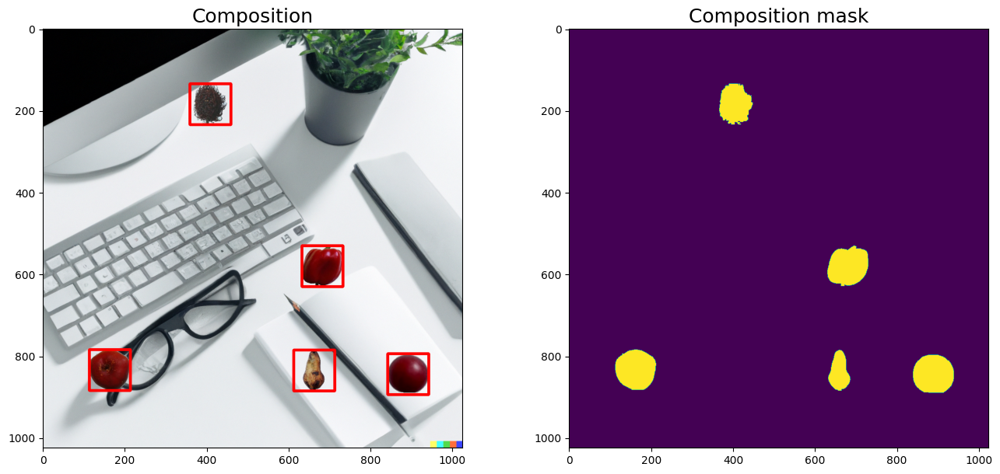

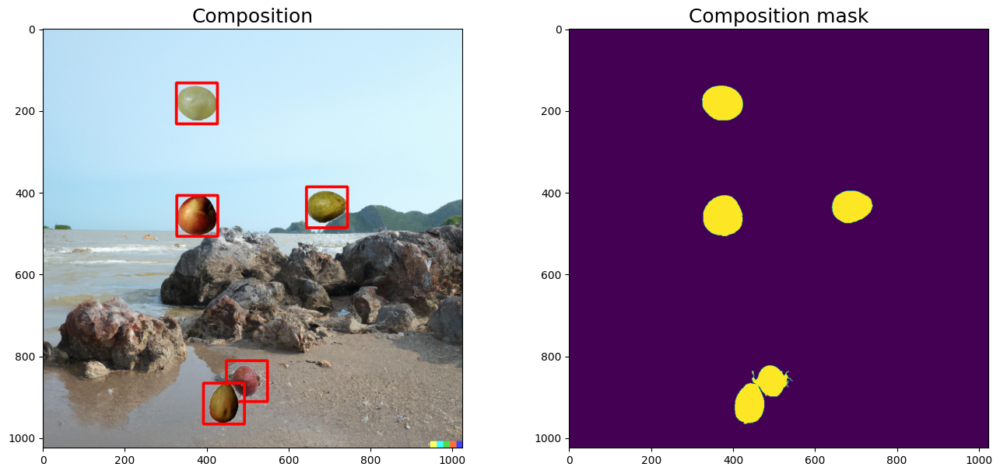

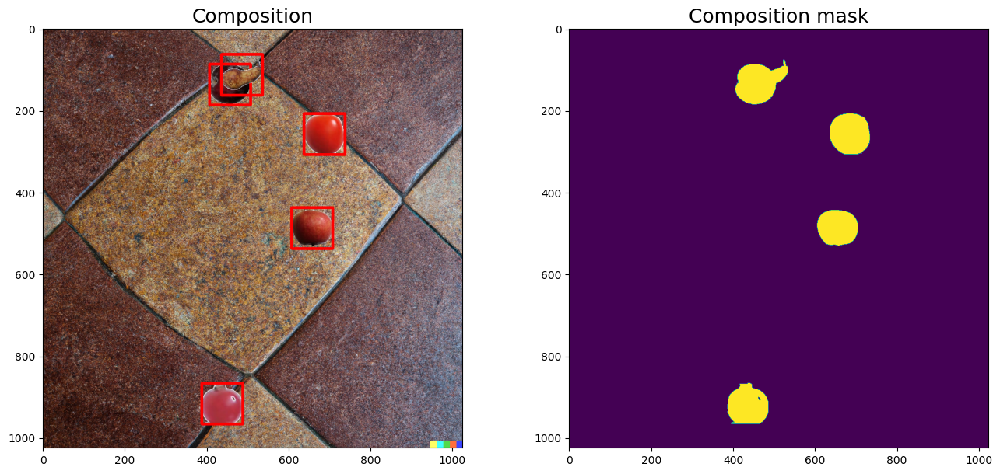

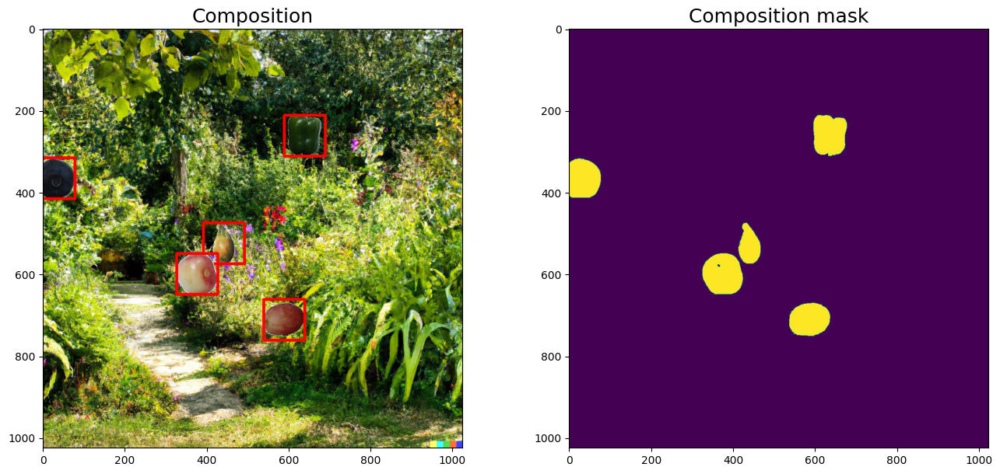

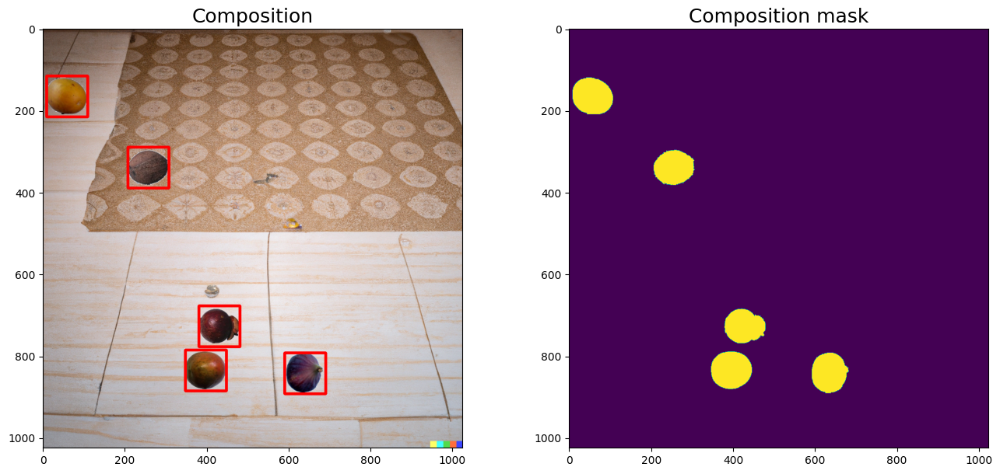

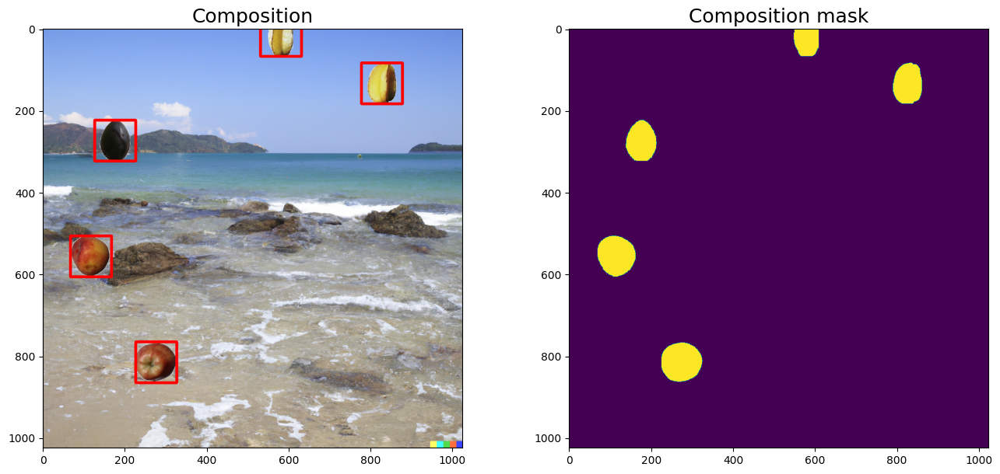

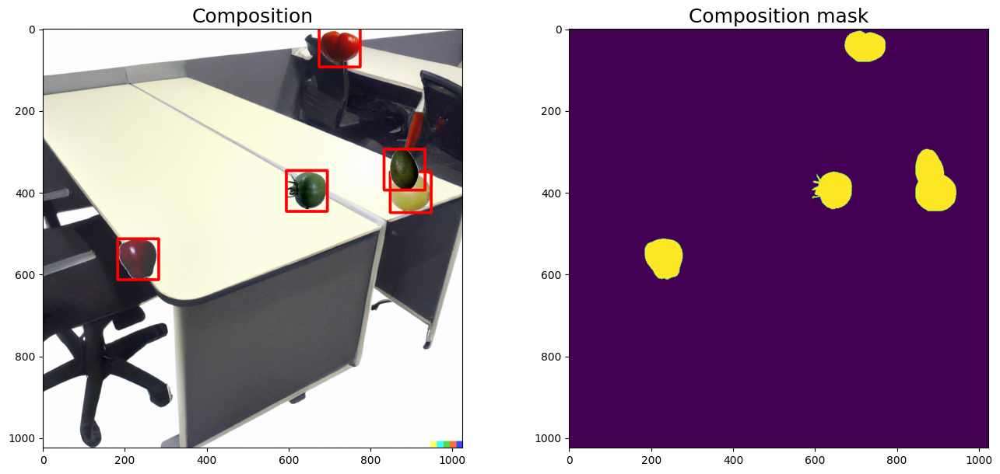

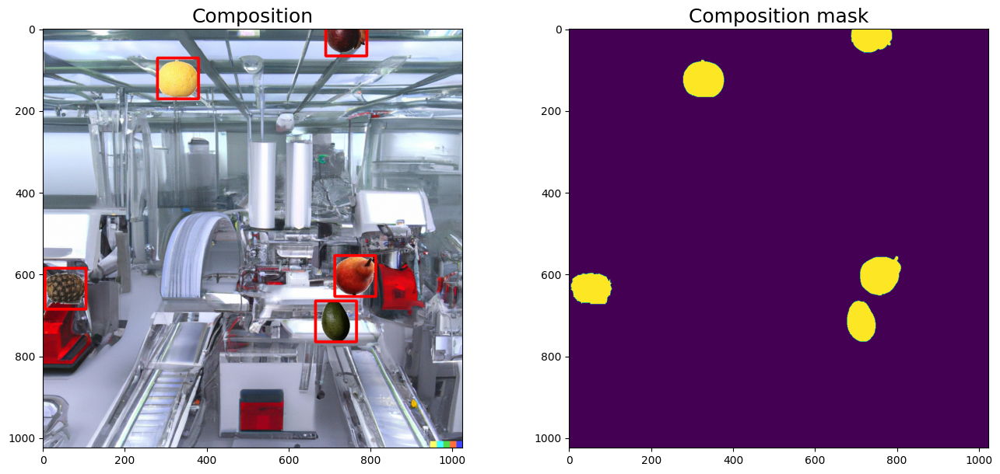

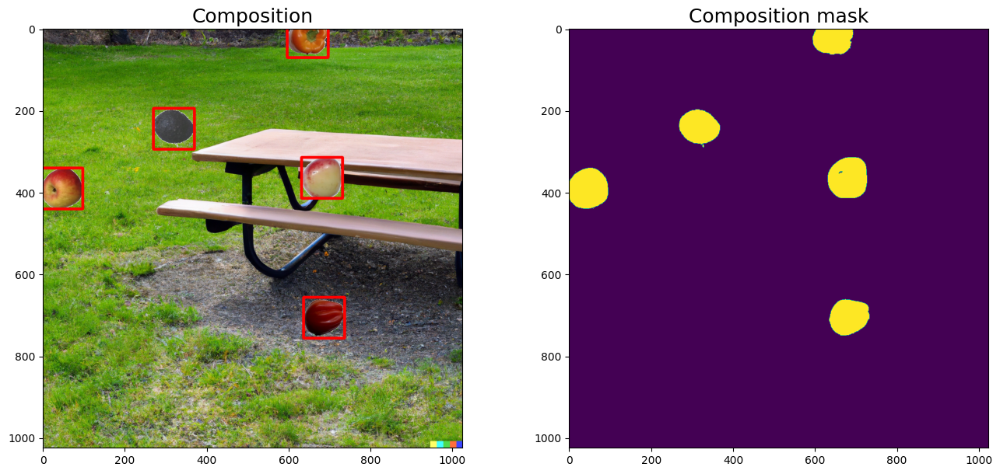

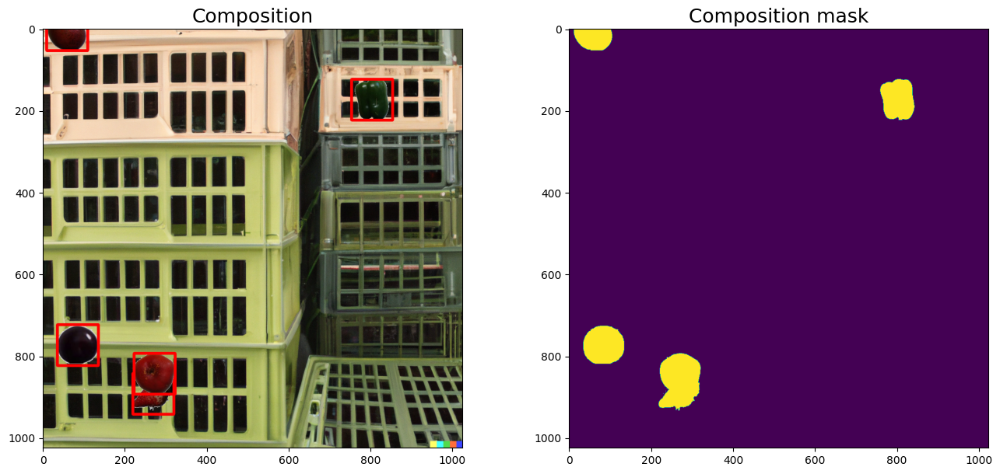

In [17]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt

def form_dataset(num_images):
    bg_folder_path = 'Data/Back Ground'
    data_path = 'Last/imgs'
    mask_path = 'Last/masks'

    os.makedirs(data_path, exist_ok=True)
    os.makedirs(mask_path, exist_ok=True)

    for i in range(num_images):
        img_bg_path = choose_bg()
        img_bg = cv2.imread(img_bg_path)
        img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)
        h, w = img_bg.shape[0], img_bg.shape[1]
        mask_comp = np.zeros((h, w), dtype=np.uint8)

        composed_img = img_bg.copy()
        composed_mask = mask_comp.copy()

        for idx in range(5):  # Her fotoğrafa 5 meyve eklenecek
            img_path, mask_path = choose_img('Data/New Dataset/', 'Data/Masked New Dataset/')
            img, mask = get_img_and_mask(img_path, mask_path)

            x = random.randint(0, w - img.shape[1])
            y = random.randint(0, h - img.shape[0])

            composed_img, composed_mask, mask_added = add_obj(composed_img, composed_mask, img, mask, x, y, idx=1)

            # Bounding box çizdir
            width = img.shape[1]
            height = img.shape[0]
            xmin = x - int(width / 2)
            ymin = y - int(height / 2)
            xmax = xmin + width
            ymax = ymin + height
            cv2.rectangle(composed_img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 6)

        fig, ax = plt.subplots(1, 2, figsize=(16, 7))
        ax[0].imshow(composed_img)
        ax[0].set_title('Composition', fontsize=18)
        ax[1].imshow(composed_mask)
        ax[1].set_title('Composition mask', fontsize=18)
       
        # Kompozit görüntüyü imgs klasörüne kaydet
        composed_img_filename = os.path.join(data_path, f'dt_img{i+1}.jpg')
        cv2.imwrite(composed_img_filename, cv2.cvtColor(composed_img, cv2.COLOR_RGB2BGR))
        
        # Tüm maskeleri bir araya getirip masks klasörüne kaydet
        mask_path="Last\masks"
        composed_mask_filename = os.path.join(mask_path, f'dt_mask{i+1}.jpg')
        cv2.imwrite(composed_mask_filename, composed_mask * 200)

num_images_to_generate = 10
form_dataset(num_images_to_generate)



[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_mask1.jpg
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_mask2.jpg
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_mask3.jpg
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_mask4.jpg
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_mask5.jpg
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_mask6.jpg
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Last\masks\dt_ma

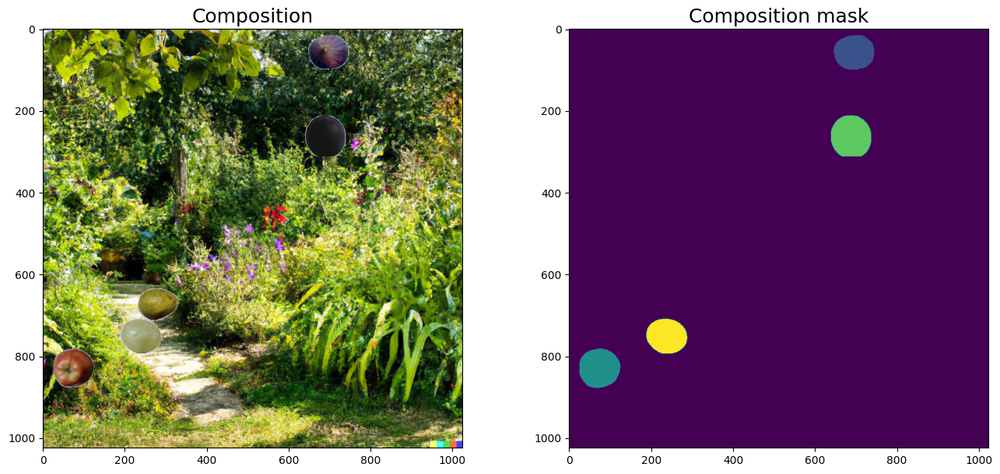

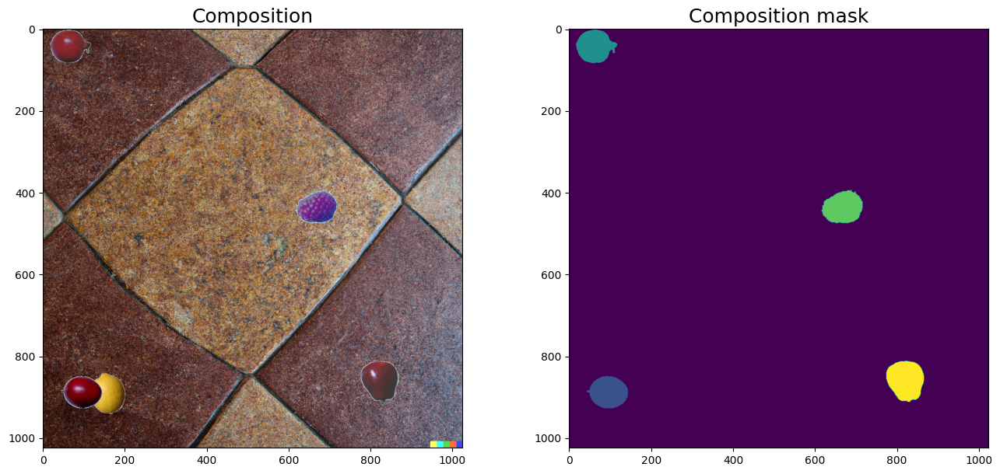

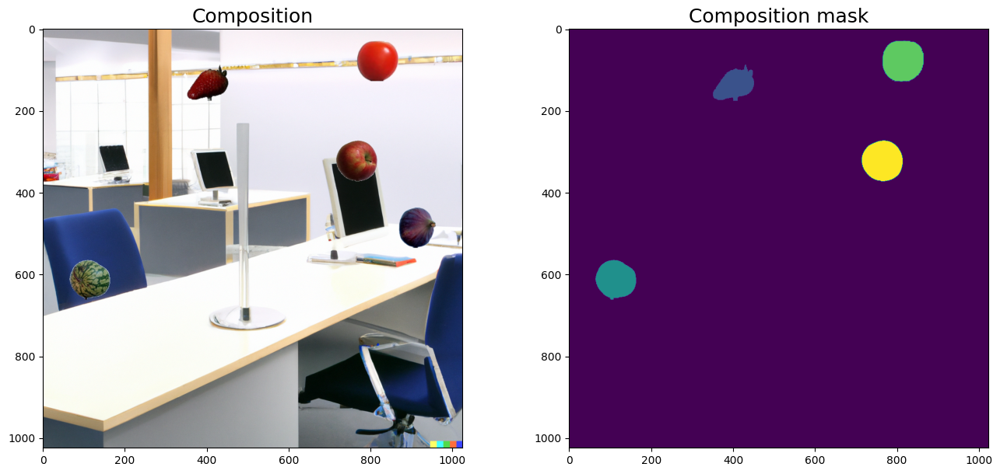

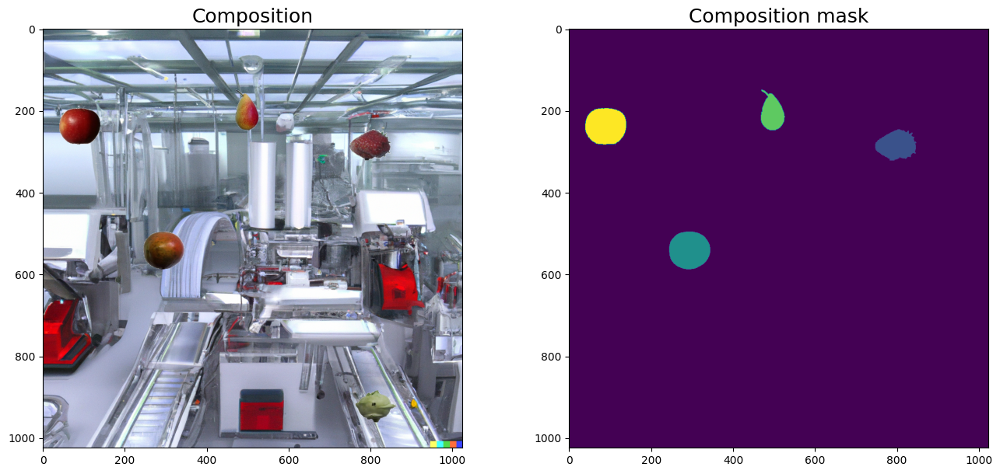

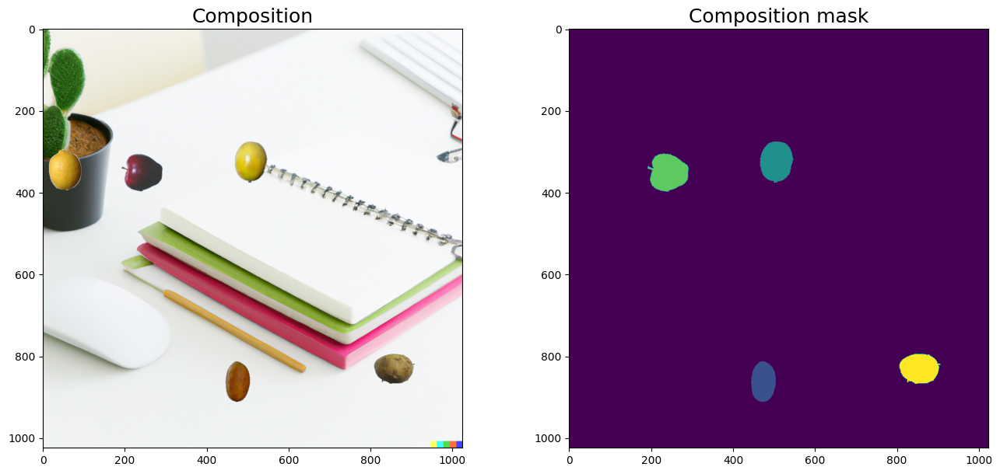

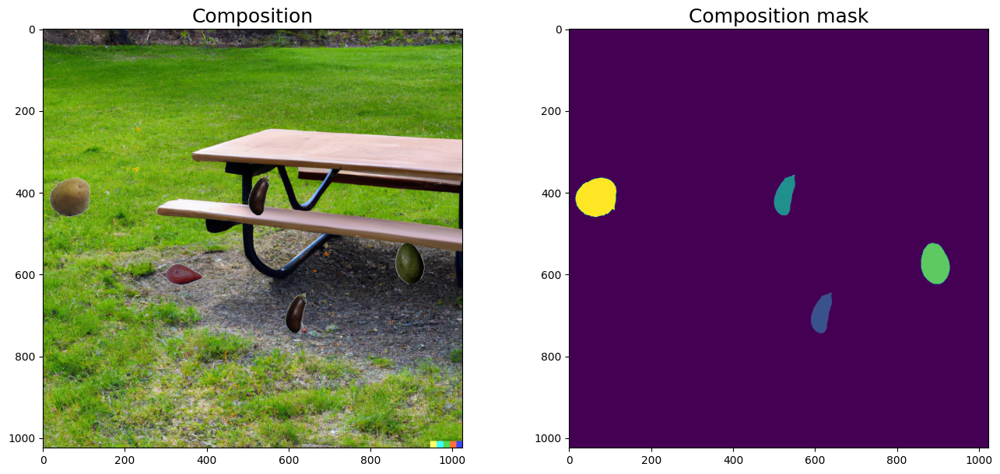

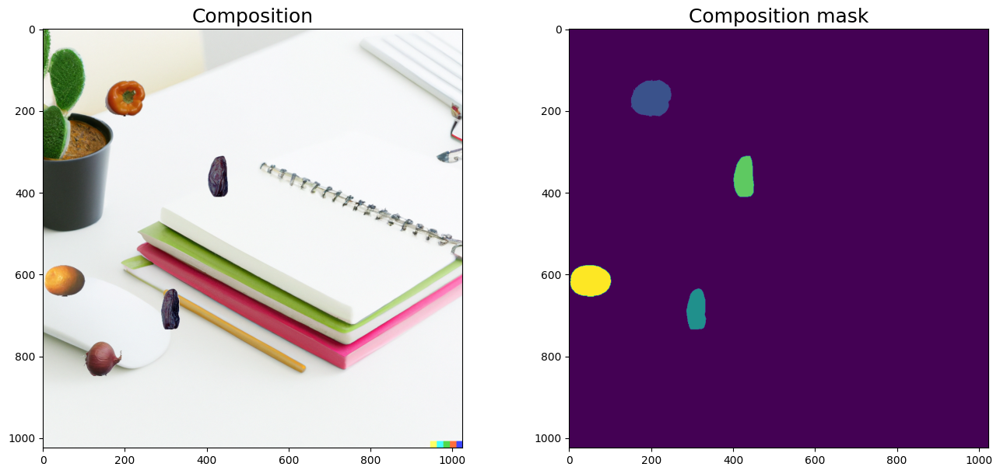

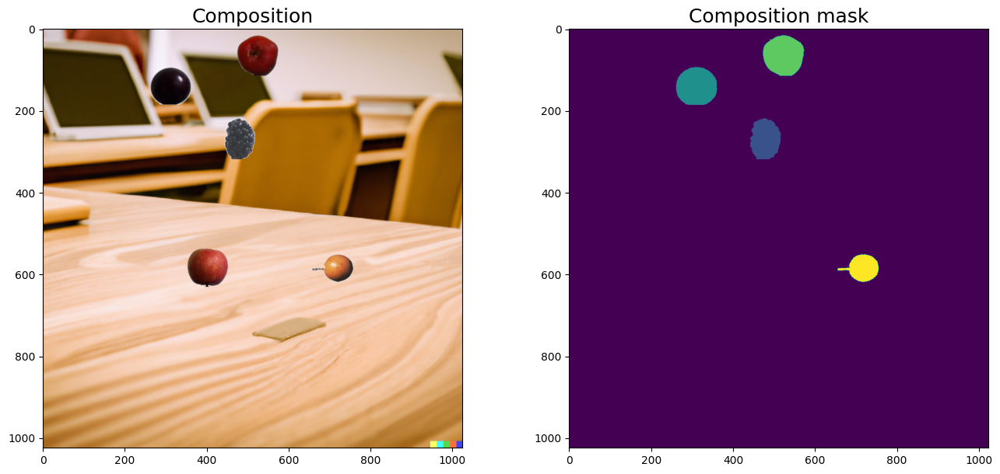

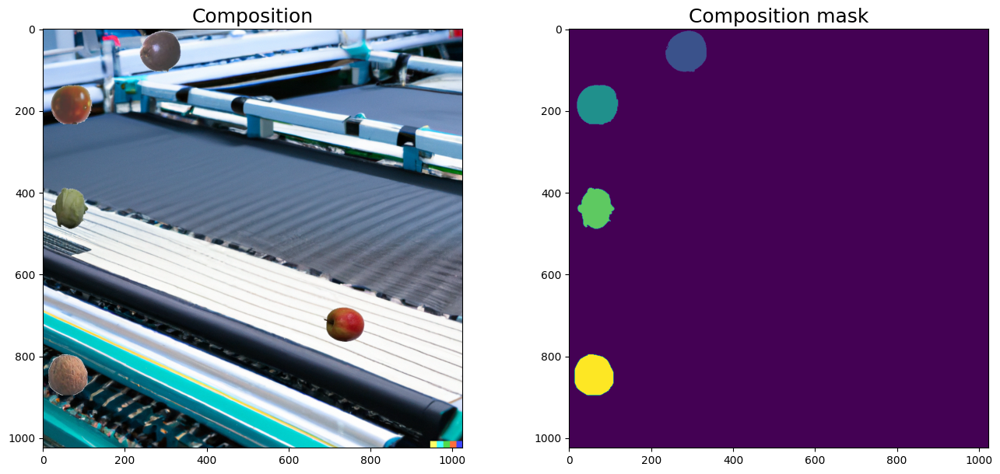

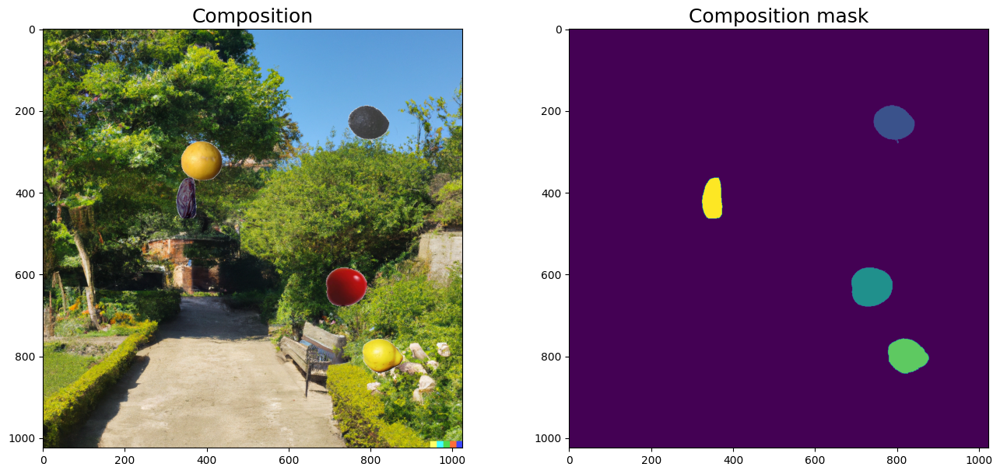

In [155]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt

def form_dataset(num_images):
    bg_folder_path = 'Data/Back Ground'
    data_path = 'Last/imgs'
    mask_path = 'Last/masks'

    os.makedirs(data_path, exist_ok=True)
    os.makedirs(mask_path, exist_ok=True)

    for i in range(num_images):
        img_bg_path = choose_bg()
        img_bg = cv2.imread(img_bg_path)
        img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)
        h, w = img_bg.shape[0], img_bg.shape[1]
        mask_comp = np.zeros((h, w), dtype=np.uint8)

        composed_img = img_bg.copy()
        composed_mask = mask_comp.copy()

        for idx in range(5):  # Her fotoğrafa 5 meyve eklenecek
            img_path, mask_path = choose_img('Data/New Dataset/', 'Data/Masked New Dataset/')
            img, mask = get_img_and_mask(img_path, mask_path)

            x = random.randint(0, w - img.shape[1])
            y = random.randint(0, h - img.shape[0])

            composed_img, composed_mask, mask_added = add_obj(composed_img, composed_mask, img, mask, x, y, idx=idx)

        fig, ax = plt.subplots(1, 2, figsize=(16, 7))
        ax[0].imshow(composed_img)
        ax[0].set_title('Composition', fontsize=18)
        ax[1].imshow(composed_mask)
        ax[1].set_title('Composition mask', fontsize=18)
       
        # Kompozit görüntüyü imgs klasörüne kaydet
        composed_img_filename = os.path.join(data_path, f'dt_img{i+1}.jpg')
        cv2.imwrite(composed_img_filename, cv2.cvtColor(composed_img, cv2.COLOR_RGB2BGR))
        
        # Tüm maskeleri bir araya getirip masks klasörüne kaydet
        mask_path="Last\masks"
        composed_mask_filename = os.path.join(mask_path, f'dt_mask{i+1}.jpg')
        print(composed_mask)
        print(composed_mask_filename)
        cv2.imwrite(composed_mask_filename, composed_mask*200)  

num_images_to_generate = 10
form_dataset(num_images_to_generate)
